# CelebA-HQ Latent Diffusion Training with Classifier-Free Guidance

This notebook trains a text-conditioned diffusion model on CelebA-HQ using **latent diffusion** (operates in VAE latent space instead of pixel space for faster training).

## Key Differences from Pixel-Space Training:
1. **VAE Encoding**: Images are encoded to 32×32×4 latents before training
2. **Faster Training**: 8x smaller spatial dimensions = much faster
3. **Latent U-Net**: 4-channel input/output (latent channels)
4. **Same CFG**: Classifier-free guidance works the same way

## Training Configuration:
- **Image size**: 256×256 → 32×32 latents (8x compression)
- **Model**: Custom UNet2DConditionModel (latent space)
- **VAE**: Pretrained SD VAE (frozen, `stabilityai/sd-vae-ft-mse`)
- **Text encoder**: CLIP ViT-B/32 (512-dim embeddings)
- **CFG**: 10% unconditional dropout
- **Batch size**: 32
- **Epochs**: 100

In [1]:
# Setup: Define project root and add to path
from pathlib import Path
import sys

PROJECT_ROOT = Path("/home/doshlom4/work/final_project")
sys.path.insert(0, str(PROJECT_ROOT))
print(f"Project root: {PROJECT_ROOT}")

Project root: /home/doshlom4/work/final_project


In [2]:
# Imports
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from datasets import load_dataset
import torchvision.transforms as transforms
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Import custom modules
from config import (
    TRAIN_CELEBA_LDM_CONFIG,
    EXPERIMENT_4_CONFIG,
    EXPERIMENT_4_DIR,
    DATASET_CACHE_DIR,
    CHECKPOINTS_DIR,
    UNET_CELEBA_LDM_CHECKPOINT_PREFIX,
    CELEBA_DATASET_NAME,
    CLIP_MODEL_NAME,
    ensure_experiment_4_dirs,
)
from models.custom_unet_celeba_ldm import CustomUNet2DConditionModelCelebaLDM
from models.vae_wrapper import VAEWrapper
from custom_datasets.celeba_hq_dataset import CelebAHQWithCaptions

print("✓ Imports successful")


/home/doshlom4/work/conda/envs/shlomid_conda_12_11_2025/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✓ Imports successful


In [3]:
# Configuration
NUM_EPOCHS = TRAIN_CELEBA_LDM_CONFIG["num_epochs"]
LEARNING_RATE = TRAIN_CELEBA_LDM_CONFIG["learning_rate"]
BATCH_SIZE = TRAIN_CELEBA_LDM_CONFIG["batch_size"]
NUM_TRAIN_TIMESTEPS = TRAIN_CELEBA_LDM_CONFIG["num_train_timesteps"]
BETA_SCHEDULE = TRAIN_CELEBA_LDM_CONFIG["beta_schedule"]
CHECKPOINT_EVERY_N_EPOCHS = TRAIN_CELEBA_LDM_CONFIG["checkpoint_every_n_epochs"]
CFG_DROPOUT_PROB = TRAIN_CELEBA_LDM_CONFIG["cfg_dropout_prob"]

IMAGE_SIZE = EXPERIMENT_4_CONFIG["image_size"]
LATENT_SIZE = EXPERIMENT_4_CONFIG["latent_size"]

print("Training configuration:")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  Learning rate: {LEARNING_RATE}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Image size: {IMAGE_SIZE}×{IMAGE_SIZE}")
print(f"  Latent size: {LATENT_SIZE}×{LATENT_SIZE}")
print(f"  CFG dropout: {CFG_DROPOUT_PROB*100:.0f}%")

Training configuration:
  Epochs: 500
  Learning rate: 1e-05
  Batch size: 128
  Image size: 256×256
  Latent size: 32×32
  CFG dropout: 10%


In [4]:
# Setup device and create directories
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"CUDA version: {torch.version.cuda}")

# Create experiment directories
ensure_experiment_4_dirs()
print(f"\n✓ Directories created")

Using device: cuda
GPU: NVIDIA A100 80GB PCIe
CUDA version: 11.8

✓ Directories created


## Step 1: Load CelebA Dataset

Load the CelebA dataset with attributes from local cache. The dataset contains 200K celebrity face images at 178×218 resolution with 40 binary attributes per image (gender, age, hair color, facial hair, accessories, etc.).

In [5]:
# Load CelebA dataset with attributes
print("Loading CelebA dataset...")
print(f"Dataset: {CELEBA_DATASET_NAME}")
print(f"Cache directory: {DATASET_CACHE_DIR}")
print()

try:
    print(f"📥 Loading '{CELEBA_DATASET_NAME}' from cache...")
    
    # Load dataset from cached location
    celeba_hq = load_dataset(
        CELEBA_DATASET_NAME,
        cache_dir=str(DATASET_CACHE_DIR / "huggingface"),
        split="train"
    )
    
    print(f"✓ Loaded {len(celeba_hq)} images")
    print(f"   Image size: {celeba_hq[0]['image'].size}")
    print(f"   Dataset features: {list(celeba_hq.features.keys())}")
    print(f"   Attributes: {len([k for k in celeba_hq.features.keys() if k not in ['image', 'celeb_id']])} binary attributes")
    print(f"\n✓ Dataset ready for training!")
    
except Exception as e:
    print(f"✗ Failed to load dataset: {e}")
    celeba_hq = None

Loading CelebA dataset...
Dataset: flwrlabs/celeba
Cache directory: /home/doshlom4/work/final_project/dataset_cache

📥 Loading 'flwrlabs/celeba' from cache...
✓ Loaded 162770 images
   Image size: (178, 218)
   Dataset features: ['image', 'celeb_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']
   Attributes: 40 binary attributes

✓ Dataset ready for training!


### Visualize Dataset Samples

Before training, let's inspect some samples from the dataset to understand:
1. The image content and quality
2. The binary attributes available
3. How text prompts are generated from attributes

DATASET SAMPLES - Raw Images from HuggingFace Dataset

Sample 0 - Attributes:
  Active attributes (11/40):
    - 5 o Clock Shadow
    - Bags Under Eyes
    - Blond Hair
    - Brown Hair
    - High Cheekbones
    - Male
    - Mouth Slightly Open
    - Narrow Eyes
    - No Beard
    - Pointy Nose
    ... and 1 more



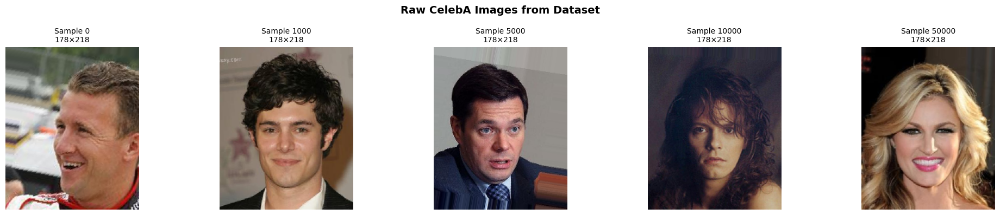


TRAINING SAMPLES - After Transforms + Text Prompts

CelebA-HQ Dataset initialized:
  - Total images: 162770
  - Available attributes: 40
  - Attributes used for prompting: 16
Sample 0:
  Caption: "A photo of a man with blonde hair, slight stubble, narrow eyes, high cheekbones, a sharp nose, smiling"
  Active attributes: 11/40

Sample 1000:
  Caption: "A photo of a young man with wavy black hair, a clean-shaven face, an oval face, bushy eyebrows, prominent cheekbones, a prominent nose, smiling"
  Active attributes: 11/40

Sample 5000:
  Caption: "A photo of a man with straight black hair, a clean-shaven face, an oval face, mouth slightly open, wearing a tie"
  Active attributes: 8/40

Sample 10000:
  Caption: "A photo of a young man with wavy brown hair, bangs, a clean-shaven face, wearing a necklace"
  Active attributes: 7/40

Sample 50000:
  Caption: "A photo of a young woman with wavy blond hair, prominent cheekbones, rosy cheeks, a sharp nose, smiling, wearing earrings, wearing hea

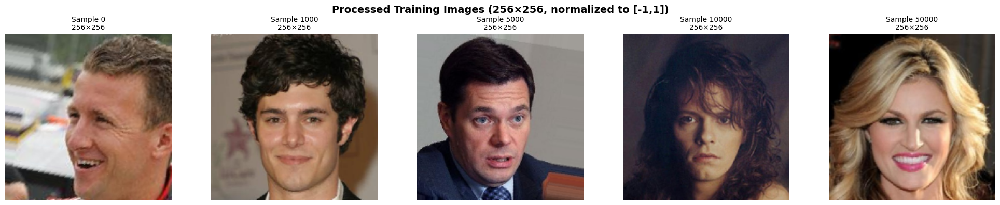


TEXT PROMPT EXAMPLES

Here are more text prompts that will be used during training:

 1. "A photo of a man with blond hair, light facial stubble, bags under the eyes, narrow eyes, prominent cheekbones, a pointy nose, smiling"
 2. "A photo of a young man with black hair, a clean-shaven face, an oval face, thick eyebrows, high cheekbones, smiling"
 3. "A photo of a young woman with wavy brown hair, arched eyebrows, high cheekbones, a pointy nose, smiling, wearing earrings, wearing a necklace, heavy makeup"
 4. "A photo of a young man with wavy black hair, a clean-shaven face, an oval face, bushy eyebrows, high cheekbones, a prominent nose, smiling"
 5. "A photo of a man with straight black hair, a clean-shaven face, an oval face, a prominent nose, with parted lips, wearing a tie"
 6. "A photo of a young man with wavy brown hair, bangs, a clean-shaven face, wearing a necklace"
 7. "A photo of a man with black hair, a five o'clock shadow, a pointy nose"
 8. "A photo of a young woman with 

In [6]:
# Visualize sample images and text prompts from the dataset
if celeba_hq is not None:
    print("=" * 80)
    print("DATASET SAMPLES - Raw Images from HuggingFace Dataset")
    print("=" * 80)
    print()
    
    # Show 5 raw samples from the HuggingFace dataset
    num_samples = 5
    sample_indices = [0, 1000, 5000, 10000, 50000]  # Diverse samples
    
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    
    for idx, sample_idx in enumerate(sample_indices):
        # Get raw sample from HuggingFace dataset
        sample = celeba_hq[sample_idx]
        image = sample['image']
        
        # Display image
        axes[idx].imshow(image)
        axes[idx].axis('off')
        axes[idx].set_title(f"Sample {sample_idx}\n{image.size[0]}×{image.size[1]}", fontsize=10)
        
        # Print attributes for first sample
        if idx == 0:
            print(f"Sample {sample_idx} - Attributes:")
            attribute_names = [k for k in sample.keys() if k not in ['image', 'celeb_id']]
            active_attrs = [attr for attr in attribute_names if sample[attr] == 1]
            print(f"  Active attributes ({len(active_attrs)}/40):")
            for attr in active_attrs[:10]:  # Show first 10
                print(f"    - {attr.replace('_', ' ')}")
            if len(active_attrs) > 10:
                print(f"    ... and {len(active_attrs) - 10} more")
            print()
    
    plt.suptitle("Raw CelebA Images from Dataset", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print()
    print("=" * 80)
    print("TRAINING SAMPLES - After Transforms + Text Prompts")
    print("=" * 80)
    print()
    
    # Now show processed samples with text prompts (using CelebAHQWithCaptions)
    # First create the transform
    transform_preview = transforms.Compose([
        transforms.Resize(IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ])
    
    # Create temporary dataset with transform
    temp_dataset = CelebAHQWithCaptions(
        hf_dataset=celeba_hq,
        transform=transform_preview,
    )
    
    # Get samples
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    
    for idx, sample_idx in enumerate(sample_indices):
        image_tensor, caption, attributes = temp_dataset[sample_idx]
        
        # Convert tensor to displayable image
        # Denormalize from [-1, 1] to [0, 1]
        image_display = (image_tensor * 0.5 + 0.5).permute(1, 2, 0).numpy()
        image_display = np.clip(image_display, 0, 1)
        
        # Display image
        axes[idx].imshow(image_display)
        axes[idx].axis('off')
        axes[idx].set_title(f"Sample {sample_idx}\n{IMAGE_SIZE}×{IMAGE_SIZE}", fontsize=10)
        
        # Print caption
        print(f"Sample {sample_idx}:")
        print(f"  Caption: \"{caption}\"")
        print(f"  Active attributes: {len([k for k, v in attributes.items() if v == 1])}/40")
        print()
    
    plt.suptitle(f"Processed Training Images ({IMAGE_SIZE}×{IMAGE_SIZE}, normalized to [-1,1])", 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print()
    print("=" * 80)
    print("TEXT PROMPT EXAMPLES")
    print("=" * 80)
    print()
    print("Here are more text prompts that will be used during training:")
    print()
    
    # Show 10 diverse text prompts
    prompt_indices = [0, 100, 500, 1000, 5000, 10000, 20000, 50000, 100000, 150000]
    for i, idx in enumerate(prompt_indices, 1):
        _, caption, _ = temp_dataset[idx]
        print(f"{i:2d}. \"{caption}\"")
    
    print()
    print("Note: During training, 10% of these prompts will be replaced with empty")
    print("      string \"\" for classifier-free guidance (CFG dropout).")
    print()
    
else:
    print("⚠ Dataset not loaded - cannot visualize samples")

In [7]:
# Print 20 samples with attributes and generated text prompts
if celeba_hq is not None:
    print("=" * 100)
    print("SAMPLE ATTRIBUTES → TEXT PROMPT CONVERSION")
    print("=" * 100)
    print()
    print("Showing how CelebA binary attributes are converted to natural language prompts")
    print()
    
    # Create dataset wrapper to generate prompts
    transform_sample = transforms.Compose([
        transforms.Resize(IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ])
    
    dataset_sample = CelebAHQWithCaptions(
        hf_dataset=celeba_hq,
        transform=transform_sample,
    )
    
    # Get ordered attribute list
    attribute_names_all = sorted([
        k for k in celeba_hq.features.keys()
        if k not in ["image", "celeb_id"]
    ])
    
    # Select 20 diverse samples
    num_samples = 20
    sample_indices = np.random.choice(len(celeba_hq), num_samples, replace=False)
    
    print(f"📋 Randomly selected {num_samples} samples:\n")
    
    for i, sample_idx in enumerate(sample_indices, 1):
        # Get sample data
        _, caption, attributes = dataset_sample[sample_idx]
        
        # Get active attributes in order
        active_attrs = [
            attr for attr in attribute_names_all
            if int(attributes.get(attr, 0)) == 1
        ]
        
        # Format active attributes as comma-separated list
        if active_attrs:
            attrs_text = ", ".join([attr.replace('_', ' ').title() for attr in active_attrs])
        else:
            attrs_text = "(No active attributes)"
        
        # Print in requested format
        print(f"{i:2d}. Sample {sample_idx}")
        print(f"    Active Attributes ({len(active_attrs)}/40): {attrs_text}")
        print(f"    Text Prompt: \"{caption}\"")
        print()
    
    print("=" * 100)
    print(f"✓ Conversion complete - {num_samples} samples processed")
    print("=" * 100)
    
else:
    print("⚠ Dataset not loaded - cannot display samples")

SAMPLE ATTRIBUTES → TEXT PROMPT CONVERSION

Showing how CelebA binary attributes are converted to natural language prompts

CelebA-HQ Dataset initialized:
  - Total images: 162770
  - Available attributes: 40
  - Attributes used for prompting: 16
📋 Randomly selected 20 samples:

 1. Sample 34773
    Active Attributes (10/40): Arched Eyebrows, Attractive, Bangs, Blond Hair, Heavy Makeup, No Beard, Oval Face, Wavy Hair, Wearing Lipstick, Young
    Text Prompt: "A photo of a young woman with wavy blond hair, bangs, curved eyebrows"

 2. Sample 64803
    Active Attributes (9/40): 5 O Clock Shadow, Attractive, Bangs, Black Hair, Bushy Eyebrows, Male, No Beard, Straight Hair, Young
    Text Prompt: "A photo of a young man with straight black hair, bangs, slight stubble, bushy eyebrows"

 3. Sample 88747
    Active Attributes (13/40): Arched Eyebrows, Big Lips, Big Nose, Black Hair, Chubby, Double Chin, Heavy Makeup, High Cheekbones, Mouth Slightly Open, No Beard, Smiling, Wearing Earrings, W

TRAINING SAMPLES - Images with Attributes & Text Prompts Used During Training

🎲 Selected 25 random samples from 162770 total images
   Sample indices: [np.int64(4834), np.int64(5489), np.int64(6270), np.int64(15833), np.int64(18219), np.int64(39305), np.int64(49898), np.int64(52922), np.int64(53849), np.int64(66287), np.int64(67221), np.int64(76913), np.int64(93137), np.int64(104377), np.int64(105875), np.int64(127689), np.int64(129735), np.int64(130637), np.int64(133983), np.int64(134884), np.int64(136269), np.int64(139381), np.int64(141553), np.int64(145332), np.int64(153921)]

CelebA-HQ Dataset initialized:
  - Total images: 162770
  - Available attributes: 40
  - Attributes used for prompting: 16
🔍 Using CelebAHQWithCaptions to generate training prompts...
   This is the SAME function used in the training loop!

ALL 40 CELEBA ATTRIBUTES (ORDERED)
 1. 5 o Clock Shadow
 2. Arched Eyebrows
 3. Attractive
 4. Bags Under Eyes
 5. Bald
 6. Bangs
 7. Big Lips
 8. Big Nose
 9. Black Hair


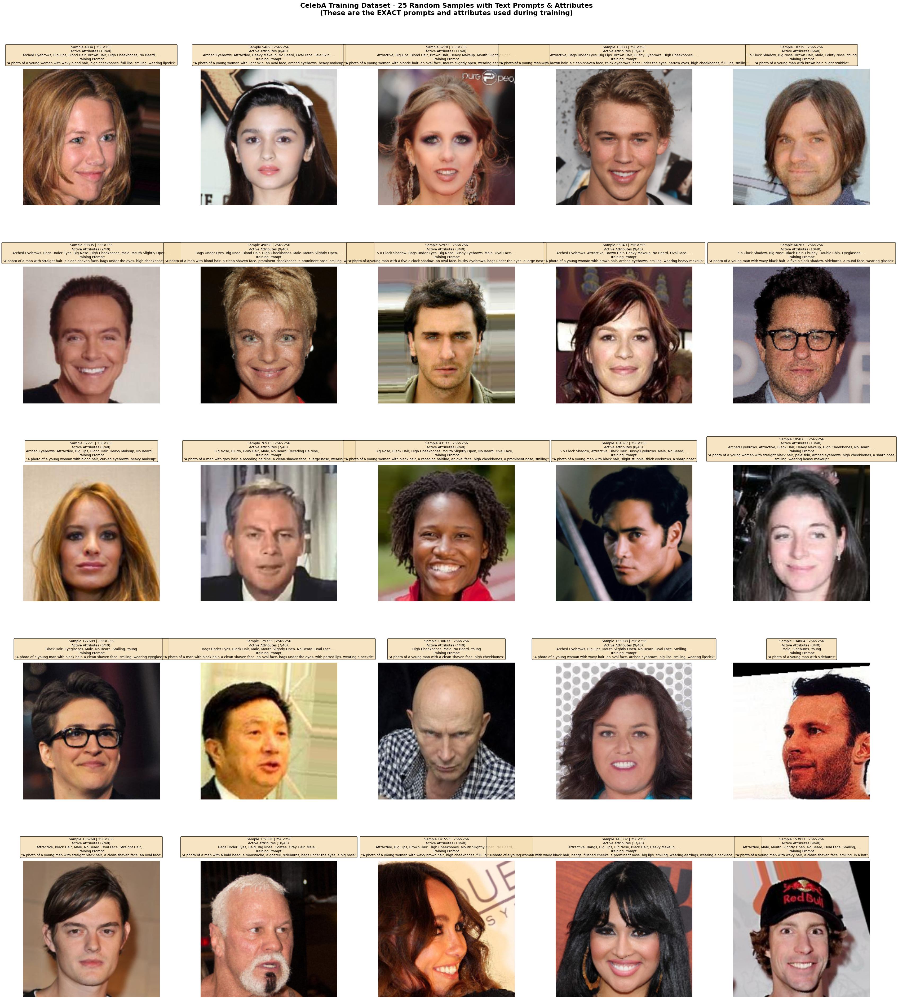

TRAINING LOOP VERIFICATION
✓ The training loop uses: CelebAHQWithCaptions(hf_dataset=celeba_hq, transform=transform)
✓ This dataset returns: (image_tensor, caption, attributes)
✓ The caption is generated from binary attributes using prompt templates
✓ During training, 10% of captions are replaced with "" for CFG dropout
✓ Total samples shown: 25
✓ Total attributes per image: 40



In [8]:
# Display 25 samples with their attributes AND training text prompts
if celeba_hq is not None:
    print("=" * 100)
    print("TRAINING SAMPLES - Images with Attributes & Text Prompts Used During Training")
    print("=" * 100)
    print()
    
    num_samples = 25
    # Select 25 RANDOM samples from the dataset
    sample_indices = sorted(np.random.choice(len(celeba_hq), num_samples, replace=False))
    print(f"🎲 Selected {num_samples} random samples from {len(celeba_hq)} total images")
    print(f"   Sample indices: {sample_indices}\n")
    
    # Create the SAME dataset wrapper used in training to get actual training prompts
    transform_viz = transforms.Compose([
        transforms.Resize(IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ])
    
    dataset_viz = CelebAHQWithCaptions(
        hf_dataset=celeba_hq,
        transform=transform_viz,
    )
    
    print("🔍 Using CelebAHQWithCaptions to generate training prompts...")
    print(f"   This is the SAME function used in the training loop!\n")
    
    # Print ALL 40 possible attributes (in order)
    attribute_names_all = sorted([
        k for k in celeba_hq.features.keys()
        if k not in ["image", "celeb_id"]
    ])
    print("=" * 100)
    print("ALL 40 CELEBA ATTRIBUTES (ORDERED)")
    print("=" * 100)
    for i, attr in enumerate(attribute_names_all, 1):
        print(f"{i:2d}. {attr.replace('_', ' ')}")
    print("=" * 100)
    print()
    
    # Create figure with 5x5 grid - LARGER for better visibility
    # Add extra spacing so long titles don't overlap neighboring subplots
    fig, axes = plt.subplots(5, 5, figsize=(34, 40))
    fig.patch.set_facecolor('white')
    axes = axes.flatten()  # Flatten to 1D array for easier indexing
    
    # Increase horizontal/vertical spacing between images
    fig.subplots_adjust(left=0.03, right=0.97, bottom=0.03, top=0.92, wspace=0.3, hspace=0.3)
    
    for idx, sample_idx in enumerate(sample_indices):
        # Get sample from the training dataset (with transform)
        image_tensor, caption, attributes = dataset_viz[sample_idx]
        
        # Convert tensor to displayable image
        # Denormalize from [-1, 1] to [0, 1]
        image_display = (image_tensor * 0.5 + 0.5).permute(1, 2, 0).numpy()
        image_display = np.clip(image_display, 0, 1)
        
        # Get active attributes in the global, ordered attribute list
        active_attrs = [
            attr for attr in attribute_names_all
            if int(attributes.get(attr, 0)) == 1
        ]
        
        # Display image
        axes[idx].imshow(image_display)
        axes[idx].axis('off')
        
        # Create a detailed text block with image info and attributes
        # Display above the image
        ax = axes[idx]
        
        # Get first 6 active attributes for display
        if len(active_attrs) <= 6:
            attr_text = ", ".join([attr.replace('_', ' ') for attr in active_attrs])
        else:
            first_6 = ", ".join([attr.replace('_', ' ') for attr in active_attrs[:6]])
            attr_text = f"{first_6}, ..."
        
        # Set title with ALL information - LARGER FONT
        title = (f"Sample {sample_idx} | {IMAGE_SIZE}×{IMAGE_SIZE}\n"
                f"Active Attributes ({len(active_attrs)}/40):\n{attr_text}\n"
                f"Training Prompt:\n\"{caption}\"")
        ax.set_title(title, fontsize=9, ha='center', wrap=True, pad=14, 
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        # Print detailed info for first 5 samples only
        if idx < 5:
            print(f"{'='*90}")
            print(f"SAMPLE {sample_idx}")
            print(f"{'='*90}")
            
            print(f"\n📝 Training Text Prompt:")
            print(f"   \"{caption}\"\n")
            
            # Separate into active (1) and inactive (0) attributes
            inactive_attrs = [attr for attr in attribute_names_all if int(attributes.get(attr, 0)) == 0]
            
            print(f"✓ Active Attributes ({len(active_attrs)}/{len(attribute_names_all)}):")
            for i, attr in enumerate(active_attrs, 1):
                print(f"   {i:2d}. {attr.replace('_', ' ')}")
            
            print(f"\n✗ Inactive Attributes ({len(inactive_attrs)}/{len(attribute_names_all)}):")
            # Only show first 10 inactive attributes to save space
            for i, attr in enumerate(inactive_attrs[:10], 1):
                print(f"   {i:2d}. {attr.replace('_', ' ')}")
            if len(inactive_attrs) > 10:
                print(f"   ... and {len(inactive_attrs) - 10} more inactive attributes")
            
            print()
    
    plt.suptitle(f"CelebA Training Dataset - 25 Random Samples with Text Prompts & Attributes\n"
                 f"(These are the EXACT prompts and attributes used during training)", 
                 fontsize=18, fontweight='bold', y=0.975)
    plt.show()
    
    print("=" * 100)
    print("TRAINING LOOP VERIFICATION")
    print("=" * 100)
    print(f"✓ The training loop uses: CelebAHQWithCaptions(hf_dataset=celeba_hq, transform=transform)")
    print(f"✓ This dataset returns: (image_tensor, caption, attributes)")
    print(f"✓ The caption is generated from binary attributes using prompt templates")
    print(f"✓ During training, 10% of captions are replaced with \"\" for CFG dropout")
    print(f"✓ Total samples shown: {num_samples}")
    print(f"✓ Total attributes per image: {len(attribute_names_all)}")
    print("=" * 100)
    print()
    
else:
    print("⚠ Dataset not loaded - cannot display samples")

In [9]:
# DEBUG: Investigate the actual dataset structure and attributes
print("=" * 100)
print("DATASET STRUCTURE INVESTIGATION")
print("=" * 100)
print()

# Check what keys are in the raw HuggingFace dataset
print("🔍 Raw HuggingFace Dataset Structure:")
sample_raw = celeba_hq[0]
print(f"   Keys in sample: {list(sample_raw.keys())}")
print(f"   Number of keys: {len(sample_raw.keys())}")
print()

# Check the image key
print(f"   'image' type: {type(sample_raw['image'])}")
print(f"   'image' size: {sample_raw['image'].size if hasattr(sample_raw['image'], 'size') else 'N/A'}")
print()

# Check celeb_id
print(f"   'celeb_id' value: {sample_raw['celeb_id']}")
print()

# List all non-image keys (these should be attributes)
non_image_keys = [k for k in sample_raw.keys() if k not in ['image', 'celeb_id']]
print(f"   Non-image keys ({len(non_image_keys)}):")
for i, key in enumerate(non_image_keys[:10]):
    val = sample_raw[key]
    print(f"      {key}: {val} (type: {type(val).__name__}, is_truthy: {bool(val)})")
if len(non_image_keys) > 10:
    print(f"      ... and {len(non_image_keys) - 10} more attributes")
print()

# Now check what CelebAHQWithCaptions sees
print("🔍 CelebAHQWithCaptions Dataset Structure:")
image_tensor, caption, attributes = dataset_viz[0]

print(f"   Returned caption: \"{caption}\"")
print(f"   Image tensor shape: {image_tensor.shape if isinstance(image_tensor, torch.Tensor) else 'N/A'}")
print(f"   Attributes dict keys: {list(attributes.keys())}")
print(f"   Attributes dict length: {len(attributes)}")
print()

# Check actual attribute values
if attributes:
    active_attrs_test = [k for k, v in attributes.items() if v == 1]
    print(f"   Active attributes: {len(active_attrs_test)}")
    print(f"   First 10 attributes and their values:")
    for key in list(attributes.keys())[:10]:
        val = attributes[key]
        print(f"      {key}: {val} (type: {type(val).__name__})")
else:
    print("   ⚠️ Attributes dict is EMPTY!")
print()

# Check a few more samples to see if it's consistent
print("🔍 Sampling 5 random images to check attribute loading:")
test_indices = np.random.choice(len(celeba_hq), 5, replace=False)
for test_idx in test_indices:
    img_t, cap, attrs = dataset_viz[test_idx]
    active = len([k for k, v in attrs.items() if v == 1])
    print(f"   Sample {test_idx}: active_attrs={active}, caption='{cap[:50]}...'")

print()
print("=" * 100)

DATASET STRUCTURE INVESTIGATION

🔍 Raw HuggingFace Dataset Structure:
   Keys in sample: ['image', 'celeb_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']
   Number of keys: 42

   'image' type: <class 'PIL.PngImagePlugin.PngImageFile'>
   'image' size: (178, 218)

   'celeb_id' value: 1

   Non-image keys (40):
      5_o_Clock_Shadow: True (type: bool, is_truthy: True)
      Arched_Eyebrows: False (type: bool, is_truthy: False)
      Attractive: False (ty

## Step 2: Initialize Models

Initialize all models:
1. **VAE** (frozen, pretrained) - for encoding/decoding
2. **UNet** (trainable) - noise prediction in latent space
3. **CLIP Text Encoder** (frozen) - text embeddings
4. **Noise Scheduler** - DDPM with squared cosine schedule

In [10]:
# Initialize VAE (frozen, pretrained)
print("Loading VAE...")
vae = VAEWrapper().to(device)
print("✓ VAE loaded and frozen")

Loading VAE...
Loading VAE from: stabilityai/sd-vae-ft-mse
VAE loaded and frozen:
  - Latent channels: 4
  - Downsample factor: 8x
  - Scale factor: 0.18215
✓ VAE loaded and frozen


In [11]:
# Initialize UNet (trainable)
print("Initializing UNet...")
unet = CustomUNet2DConditionModelCelebaLDM().to(device)
unet.print_parameter_count()
print("✓ UNet initialized")

Initializing UNet...
Number of trainable parameters: 109,370,116 (109.4M)
✓ UNet initialized


In [12]:
# Initialize CLIP text encoder and tokenizer (frozen)
print("Loading CLIP...")
text_encoder = CLIPTextModel.from_pretrained(
    CLIP_MODEL_NAME,
    cache_dir=str(DATASET_CACHE_DIR / "huggingface"),
).to(device)
text_encoder.eval()
text_encoder.requires_grad_(False)

tokenizer = CLIPTokenizer.from_pretrained(
    CLIP_MODEL_NAME,
    cache_dir=str(DATASET_CACHE_DIR / "huggingface"),
)
print("✓ CLIP loaded and frozen")

Loading CLIP...
✓ CLIP loaded and frozen


In [13]:
# Initialize noise scheduler
noise_scheduler = DDPMScheduler(
    num_train_timesteps=NUM_TRAIN_TIMESTEPS,
    beta_schedule=BETA_SCHEDULE,
)
print(f"✓ Noise scheduler initialized ({NUM_TRAIN_TIMESTEPS} timesteps)")

✓ Noise scheduler initialized (1000 timesteps)


## Step 3: Prepare Dataset

Create transforms and dataset. Images are:
1. Resized to 256×256
2. Converted to tensor
3. Normalized to [-1, 1] (required for VAE)

In [14]:
# Define transforms
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),  # Normalize to [-1, 1]
])

# Create dataset (only if celeba_hq was loaded)
if celeba_hq is not None:
    dataset = CelebAHQWithCaptions(
        hf_dataset=celeba_hq,
        transform=transform,
    )
    
    # Create dataloader
    dataloader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
    )
    
    print(f"✓ Dataset ready: {len(dataset)} images")
    print(f"✓ DataLoader ready: {len(dataloader)} batches")
else:
    print("⚠ Skipping dataset creation (dataset not loaded)")
    dataloader = None

CelebA-HQ Dataset initialized:
  - Total images: 162770
  - Available attributes: 40
  - Attributes used for prompting: 16
✓ Dataset ready: 162770 images
✓ DataLoader ready: 1272 batches


## Step 4: Training Setup

Initialize optimizer and prepare for training.

In [15]:
# Initialize optimizer
optimizer = torch.optim.AdamW(unet.parameters(), lr=LEARNING_RATE)
print(f"✓ Optimizer initialized (AdamW, lr={LEARNING_RATE})")

✓ Optimizer initialized (AdamW, lr=1e-05)


## Step 4.5: Load Latest Checkpoint (Resume Training)

Find and load the latest checkpoint to continue training from where we left off.

In [16]:
# Find the latest checkpoint
import glob
from pathlib import Path

checkpoint_pattern = str(CHECKPOINTS_DIR / f"{UNET_CELEBA_LDM_CHECKPOINT_PREFIX}*.pt")
print(f"Searching for checkpoints with pattern: {checkpoint_pattern}")
print(f"Checkpoint prefix: {UNET_CELEBA_LDM_CHECKPOINT_PREFIX}")
print(f"Checkpoints directory: {CHECKPOINTS_DIR}")
print()

checkpoint_files = glob.glob(checkpoint_pattern)
print(f"Found {len(checkpoint_files)} files matching pattern")

# Filter out 'final' checkpoint - check only filename, not full path!
checkpoint_files = [f for f in checkpoint_files if 'final.pt' not in Path(f).name]
print(f"After filtering 'final.pt': {len(checkpoint_files)} files")

if checkpoint_files:
    checkpoint_files.sort(key=lambda x: int(x.split('epoch_')[-1].split('.pt')[0]))
    
    latest_checkpoint = checkpoint_files[-1]
    print(f"\nLatest checkpoint: {latest_checkpoint}")
    
    # Load checkpoint
    checkpoint = torch.load(latest_checkpoint, map_location=device)
    
    # Restore model state
    unet.load_state_dict(checkpoint['unet_state_dict'])
    print(f"✓ Loaded UNet state from checkpoint")
    
    # Restore optimizer state
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    print(f"✓ Loaded optimizer state from checkpoint")
    
    # Get training state
    completed_epoch = checkpoint['epoch']  # Last completed epoch (0-indexed)
    start_epoch = completed_epoch + 1  # Next epoch to train (0-indexed)
    global_step_start = checkpoint['global_step']
    last_loss = checkpoint['loss']
    
    print(f"\nCheckpoint info:")
    print(f"  Last completed epoch: {completed_epoch} (epoch {completed_epoch + 1} in 1-indexed)")
    print(f"  Next epoch to train: {start_epoch} (epoch {start_epoch + 1} in 1-indexed)")
    print(f"  Global step: {global_step_start}")
    print(f"  Last loss: {last_loss:.4f}")
    
    # Check if training is complete
    if start_epoch >= NUM_EPOCHS:
        print(f"\n⚠️  Training is COMPLETE! Already trained {completed_epoch + 1} epochs (target: {NUM_EPOCHS})")
        print(f"   To continue training, increase NUM_EPOCHS in config.py")
    else:
        remaining_epochs = NUM_EPOCHS - start_epoch
        print(f"\n✓ Will resume training from epoch {start_epoch} ({remaining_epochs} epochs remaining)")
    print()
else:
    print("\n⚠ No checkpoint found - starting from scratch")
    print(f"Make sure checkpoint files exist at: {CHECKPOINTS_DIR}")
    print(f"With prefix: {UNET_CELEBA_LDM_CHECKPOINT_PREFIX}")
    start_epoch = 0
    global_step_start = 0


Searching for checkpoints with pattern: /home/doshlom4/work/final_project/checkpoints/celeba_ldm_unet_checkpoint_epoch_*.pt
Checkpoint prefix: celeba_ldm_unet_checkpoint_epoch_
Checkpoints directory: /home/doshlom4/work/final_project/checkpoints

Found 74 files matching pattern
After filtering 'final.pt': 74 files

Latest checkpoint: /home/doshlom4/work/final_project/checkpoints/celeba_ldm_unet_checkpoint_epoch_369.pt
✓ Loaded UNet state from checkpoint
✓ Loaded optimizer state from checkpoint

Checkpoint info:
  Last completed epoch: 369 (epoch 370 in 1-indexed)
  Next epoch to train: 370 (epoch 371 in 1-indexed)
  Global step: 470640
  Last loss: 0.2338

✓ Will resume training from epoch 370 (130 epochs remaining)



In [17]:
# List all available checkpoints
print("=" * 80)
print("AVAILABLE CHECKPOINTS")
print("=" * 80)
print()

if checkpoint_files:
    print(f"Found {len(checkpoint_files)} checkpoint(s):\n")
    for i, ckpt in enumerate(checkpoint_files, 1):
        ckpt_name = ckpt.split('/')[-1]
        epoch_num = int(ckpt_name.split('epoch_')[-1].split('.pt')[0])
        
        # Load checkpoint to get loss info
        ckpt_data = torch.load(ckpt, map_location='cpu')
        loss = ckpt_data.get('loss', 'N/A')
        global_steps = ckpt_data.get('global_step', 'N/A')
        
        # Format loss properly
        loss_str = f"{loss:.4f}" if isinstance(loss, float) else str(loss)
        
        print(f"{i:2d}. {ckpt_name}")
        print(f"    Epoch: {epoch_num + 1}, Global Step: {global_steps}, Loss: {loss_str}")
        print()
    
    print(f"➜ Will resume from: {latest_checkpoint.split('/')[-1]}")
else:
    print("No checkpoints found. Will start training from scratch.")

print()
print("=" * 80)
print()

AVAILABLE CHECKPOINTS

Found 74 checkpoint(s):

 1. celeba_ldm_unet_checkpoint_epoch_4.pt
    Epoch: 5, Global Step: 6360, Loss: 0.2842

 2. celeba_ldm_unet_checkpoint_epoch_9.pt
    Epoch: 10, Global Step: 12720, Loss: 0.2737

 3. celeba_ldm_unet_checkpoint_epoch_14.pt
    Epoch: 15, Global Step: 19080, Loss: 0.2693

 4. celeba_ldm_unet_checkpoint_epoch_19.pt
    Epoch: 20, Global Step: 25440, Loss: 0.2638

 5. celeba_ldm_unet_checkpoint_epoch_24.pt
    Epoch: 25, Global Step: 31800, Loss: 0.2629

 6. celeba_ldm_unet_checkpoint_epoch_29.pt
    Epoch: 30, Global Step: 38160, Loss: 0.2605

 7. celeba_ldm_unet_checkpoint_epoch_34.pt
    Epoch: 35, Global Step: 44520, Loss: 0.2587

 8. celeba_ldm_unet_checkpoint_epoch_39.pt
    Epoch: 40, Global Step: 50880, Loss: 0.2578

 9. celeba_ldm_unet_checkpoint_epoch_44.pt
    Epoch: 45, Global Step: 57240, Loss: 0.2558

10. celeba_ldm_unet_checkpoint_epoch_49.pt
    Epoch: 50, Global Step: 63600, Loss: 0.2547

11. celeba_ldm_unet_checkpoint_epoch

## Step 5: Training Loop

Key steps in each training iteration:
1. **Encode images to latents** using frozen VAE
2. **Add noise** to latents (in latent space, not pixel space)
3. **Get text embeddings** from CLIP
4. **Apply CFG dropout**: Replace 10% of prompts with empty string
5. **Predict noise** using UNet
6. **Compute loss** and update weights

**Note**: This is much faster than pixel-space training because we operate on 32×32 latents instead of 256×256 pixels!

In [ ]:
# Training loop
print("Starting training...\n")

# Use start_epoch and global_step_start from checkpoint loading
global_step = global_step_start if 'global_step_start' in locals() else 0
start_epoch_num = start_epoch if 'start_epoch' in locals() else 0

print(f"Training from epoch {start_epoch_num + 1} to {NUM_EPOCHS}")
print(f"Initial global step: {global_step}\n")

# Define loss log file path
loss_log_path = EXPERIMENT_4_DIR / "training_losses.txt"
print(f"Loss log file: {loss_log_path}")
print()

# Create loss log file with header if starting from scratch
if start_epoch_num == 0 and not loss_log_path.exists():
    with open(loss_log_path, 'w') as f:
        f.write("# CelebA-HQ Latent Diffusion Training Losses\n")
        f.write("# Format: epoch,avg_loss\n")
    print(f"✓ Created new loss log file: {loss_log_path.name}")
elif loss_log_path.exists():
    print(f"✓ Appending to existing loss log file: {loss_log_path.name}")
else:
    with open(loss_log_path, 'w') as f:
        f.write("# CelebA-HQ Latent Diffusion Training Losses\n")
        f.write("# Format: epoch,avg_loss\n")
    print(f"✓ Created new loss log file: {loss_log_path.name}")
print()

losses = []  # Collect average loss for each epoch

for epoch in range(start_epoch_num, NUM_EPOCHS):
    unet.train()
    epoch_loss = 0.0
    
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")
    
    for batch_idx, (images, captions, attributes) in enumerate(progress_bar):
        images = images.to(device)  # (B, 3, 256, 256)
        
        # Step 1: Encode images to latents using VAE
        with torch.no_grad():
            latents = vae.encode(images)  # (B, 4, 32, 32)
        
        # Step 2: Sample noise to add to latents
        noise = torch.randn_like(latents)
        
        # Step 3: Sample random timesteps
        timesteps = torch.randint(
            0, NUM_TRAIN_TIMESTEPS, (latents.shape[0],),
            device=device,
        ).long()
        
        # Step 4: Add noise to latents according to timesteps
        noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)
        
        # Step 5: Get text embeddings
        # Apply CFG dropout: randomly replace captions with empty string
        cfg_mask = torch.rand(len(captions)) < CFG_DROPOUT_PROB
        captions_cfg = [
            "" if cfg_mask[i] else captions[i]
            for i in range(len(captions))
        ]
        
        # Tokenize and encode
        text_inputs = tokenizer(
            captions_cfg,
            padding="max_length",
            max_length=tokenizer.model_max_length,
            truncation=True,
            return_tensors="pt",
        )
        
        with torch.no_grad():
            encoder_hidden_states = text_encoder(
                text_inputs.input_ids.to(device)
            )[0]  # (B, 77, 512)
        
        # Step 6: Predict noise using UNet
        noise_pred = unet(
            noisy_latents,
            timesteps,
            encoder_hidden_states,
        ).sample
        
        # Step 7: Compute loss
        loss = F.mse_loss(noise_pred, noise)
        
        # Step 8: Backprop and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Track loss
        epoch_loss += loss.item()
        global_step += 1
        
        # Update progress bar
        progress_bar.set_postfix({
            "loss": f"{loss.item():.4f}",
            "avg_loss": f"{epoch_loss/(batch_idx+1):.4f}",
        })
    
    # End of epoch
    avg_epoch_loss = epoch_loss / len(dataloader)
    losses.append(avg_epoch_loss)  # Collect loss for plotting
    print(f"Epoch {epoch+1}/{NUM_EPOCHS} - Average loss: {avg_epoch_loss:.4f}")
    
    # Write loss to file (append mode)
    with open(loss_log_path, 'a') as f:
        f.write(f"{epoch},{avg_epoch_loss:.6f}\n")
    
    # Save checkpoint
    if (epoch + 1) % CHECKPOINT_EVERY_N_EPOCHS == 0:
        checkpoint_path = CHECKPOINTS_DIR / f"{UNET_CELEBA_LDM_CHECKPOINT_PREFIX}{epoch}.pt"
        
        torch.save({
            "epoch": epoch,
            "global_step": global_step,
            "unet_state_dict": unet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": avg_epoch_loss,
            "config": {
                "image_size": IMAGE_SIZE,
                "latent_size": LATENT_SIZE,
                "vae_model": "stabilityai/sd-vae-ft-mse",
                "vae_scale_factor": vae.scale_factor,
            },
        }, checkpoint_path)
        
        print(f"✓ Saved checkpoint: {checkpoint_path.name}")

print("\n✓ Training complete!")
print(f"\nTraining losses (average loss per epoch):")
print(losses)
print(f"\n✓ All losses saved to: {loss_log_path}")


Starting training...

Training from epoch 371 to 500
Initial global step: 470640

Loss log file: /home/doshlom4/work/final_project/outputs/experiment_4/training_losses.txt

✓ Appending to existing loss log file: training_losses.txt



Epoch 371/500: 100%|██████████| 1272/1272 [21:21<00:00,  1.01s/it, loss=0.2305, avg_loss=0.2340]


Epoch 371/500 - Average loss: 0.2340


Epoch 372/500: 100%|██████████| 1272/1272 [21:11<00:00,  1.00it/s, loss=0.2124, avg_loss=0.2349]


Epoch 372/500 - Average loss: 0.2349


Epoch 373/500: 100%|██████████| 1272/1272 [21:11<00:00,  1.00it/s, loss=0.2489, avg_loss=0.2347]


Epoch 373/500 - Average loss: 0.2347


Epoch 374/500:  69%|██████▊   | 872/1272 [14:32<06:39,  1.00it/s, loss=0.2393, avg_loss=0.2346]

## Step 5.5: Load and Plot Losses from Log File

After training (or during training interruptions), you can load the training losses from the persistent log file. This is useful when cell output is cleared or if you need to resume analysis later.

The loss log file is saved at: `outputs/experiment_4/training_losses.txt`

Format: `epoch,avg_loss`


In [ ]:
# Read training losses from file
loss_log_path = EXPERIMENT_4_DIR / "training_losses.txt"

if loss_log_path.exists():
    print("=" * 80)
    print("TRAINING LOSSES FROM LOG FILE")
    print("=" * 80)
    print()
    
    # Read losses from file
    epochs_from_file = []
    losses_from_file = []
    
    with open(loss_log_path, 'r') as f:
        for line in f:
            line = line.strip()
            # Skip comments and empty lines
            if line.startswith('#') or not line:
                continue
            
            # Parse epoch,loss
            try:
                epoch_str, loss_str = line.split(',')
                epochs_from_file.append(int(epoch_str))
                losses_from_file.append(float(loss_str))
            except ValueError:
                print(f"⚠ Skipping invalid line: {line}")
                continue
    
    print(f"✓ Loaded {len(losses_from_file)} loss values from file")
    print(f"  File: {loss_log_path}")
    print(f"  Epoch range: {min(epochs_from_file) if epochs_from_file else 'N/A'} to {max(epochs_from_file) if epochs_from_file else 'N/A'}")
    print()
    
    # Show first and last 5 losses
    if len(losses_from_file) > 0:
        print("First 5 epochs:")
        for i in range(min(5, len(losses_from_file))):
            print(f"  Epoch {epochs_from_file[i]:3d}: {losses_from_file[i]:.6f}")
        print()
        
        if len(losses_from_file) > 5:
            print("Last 5 epochs:")
            for i in range(max(0, len(losses_from_file) - 5), len(losses_from_file)):
                print(f"  Epoch {epochs_from_file[i]:3d}: {losses_from_file[i]:.6f}")
            print()
    
    # Plot losses
    if len(losses_from_file) > 0:
        plt.figure(figsize=(12, 6))
        plt.plot([e + 1 for e in epochs_from_file], losses_from_file, 'b-', linewidth=2, marker='o', markersize=4)
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Average Loss', fontsize=12)
        plt.title('Training Loss Curve - CelebA-HQ Latent Diffusion (from log file)', fontsize=14, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        # Add statistics
        min_loss = min(losses_from_file)
        max_loss = max(losses_from_file)
        final_loss = losses_from_file[-1]
        min_epoch = epochs_from_file[losses_from_file.index(min_loss)] + 1
        
        stats_text = f'Min Loss: {min_loss:.6f} (Epoch {min_epoch})\nFinal Loss: {final_loss:.6f}\nTotal Epochs: {len(losses_from_file)}'
        plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
                 fontsize=10, verticalalignment='top', horizontalalignment='right',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        plt.tight_layout()
        plt.show()
        
        print("=" * 80)
    else:
        print("⚠ No valid loss values found in file")
else:
    print(f"⚠ Loss log file not found: {loss_log_path}")
    print("  Run the training loop first to generate the loss log.")


## Step 6: Save Final Model

Save the final trained model checkpoint.

In [ ]:
# Save final checkpoint
final_checkpoint_path = CHECKPOINTS_DIR / f"{UNET_CELEBA_LDM_CHECKPOINT_PREFIX}final.pt"

torch.save({
    "epoch": NUM_EPOCHS - 1,
    "global_step": global_step,
    "unet_state_dict": unet.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "config": {
        "image_size": IMAGE_SIZE,
        "latent_size": LATENT_SIZE,
        "vae_model": "stabilityai/sd-vae-ft-mse",
        "vae_scale_factor": vae.scale_factor,
    },
}, final_checkpoint_path)

print(f"✓ Saved final checkpoint: {final_checkpoint_path}")

## Next Steps

1. **Inference**: Use `inference1_t2i_celeba_hq_ldm_cfg.ipynb` to generate images
2. **Metrics**: Use `metrics1_evaluate_celeba_hq.ipynb` to compute FID and CLIP scores
3. **Classifier**: Train attribute classifier in `train2_train_celeba_attribute_classifier.ipynb`

The trained model can generate 256×256 face images from text prompts like:
- "A photo of a young woman with blond hair, smiling"
- "A portrait of an older man with eyeglasses"
- "A young person with black hair and no accessories"

In [ ]:
# Hard-coded training losses (average loss per epoch)
# Values extracted from training cell output
training_losses = [
    0.3703, 0.3061, 0.2948, 0.2895, 0.2842, 0.2818, 0.2780, 0.2766, 0.2750, 0.2737,
    0.2724, 0.2712, 0.2707, 0.2686, 0.2693, 0.2670, 0.2667, 0.2657, 0.2647, 0.2638,
    0.2641, 0.2642, 0.2616, 0.2639, 0.2629, 0.2614, 0.2616, 0.2607, 0.2611, 0.2605,
    0.2591, 0.2595, 0.2586, 0.2592, 0.2587, 0.2573, 0.2589, 0.2578, 0.2576, 0.2578,
    0.2567, 0.2566, 0.2557, 0.2563, 0.2558, 0.2558, 0.2555, 0.2557, 0.2551, 0.2547,
    0.2554, 0.2539, 0.2539, 0.2535, 0.2541, 0.2542, 0.2530, 0.2542, 0.2531, 0.2533,
    0.2523, 0.2516, 0.2520, 0.2527, 0.2513, 0.2509, 0.2520, 0.2520, 0.2520, 0.2522,
    0.2511, 0.2509, 0.2519, 0.2515, 0.2518, 0.2519, 0.2514, 0.2508, 0.2506, 0.2510,
    0.2518, 0.2509, 0.2499, 0.2502, 0.2496, 0.2499, 0.2486, 0.2498,
    0.2504, 0.2491, 0.2487, 0.2495, 0.2489, 0.2493, 0.2488, 0.2492, 0.2490, 0.2485, 0.2489, 0.2484,
]

print(f"Loaded {len(training_losses)} loss values")
if len(training_losses) > 0:
    print(f"Loss range: {min(training_losses):.6f} to {max(training_losses):.6f}")

In [ ]:
import matplotlib.pyplot as plt
# Plot training loss
if len(training_losses) > 0:
    plt.figure(figsize=(12, 6))
    plt.plot(range(1, len(training_losses) + 1), training_losses, 'b-', linewidth=2, marker='o', markersize=4)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Average Loss', fontsize=12)
    plt.title('Training Loss Curve - CelebA-HQ Latent Diffusion Model', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.xlim(1, len(training_losses))
    
    # Add some statistics
    min_loss = min(training_losses)
    max_loss = max(training_losses)
    final_loss = training_losses[-1]
    min_epoch = training_losses.index(min_loss) + 1
    
    stats_text = f'Min Loss: {min_loss:.6f} (Epoch {min_epoch})\nFinal Loss: {final_loss:.6f}\nTotal Epochs: {len(training_losses)}'
    plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    print(f"Training Loss Statistics:")
    print(f"  Total epochs: {len(training_losses)}")
    print(f"  Minimum loss: {min_loss:.6f} at epoch {min_epoch}")
    print(f"  Maximum loss: {max_loss:.6f}")
    print(f"  Final loss: {final_loss:.6f}")
    print(f"  Average loss: {sum(training_losses) / len(training_losses):.6f}")
else:
    print("⚠ No training losses to plot - run the training cell first")
